# Filtering stressed cells

In [1]:
#loading packages
library(ggplot2)
library(magrittr)
library(data.table)
library(Seurat)
library(DropletUtils)
library(Matrix)
library(dplyr)
library(RColorBrewer)
library(MAST)
library(viridis)
library(mclust)

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    

In [2]:
#loading data
seu_HQC <- readRDS(file = "../../data/seurat_object/Set2/seu_HQC_Set2.obj")

In [3]:
Idents(seu_HQC) <- "seurat_clusters"

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


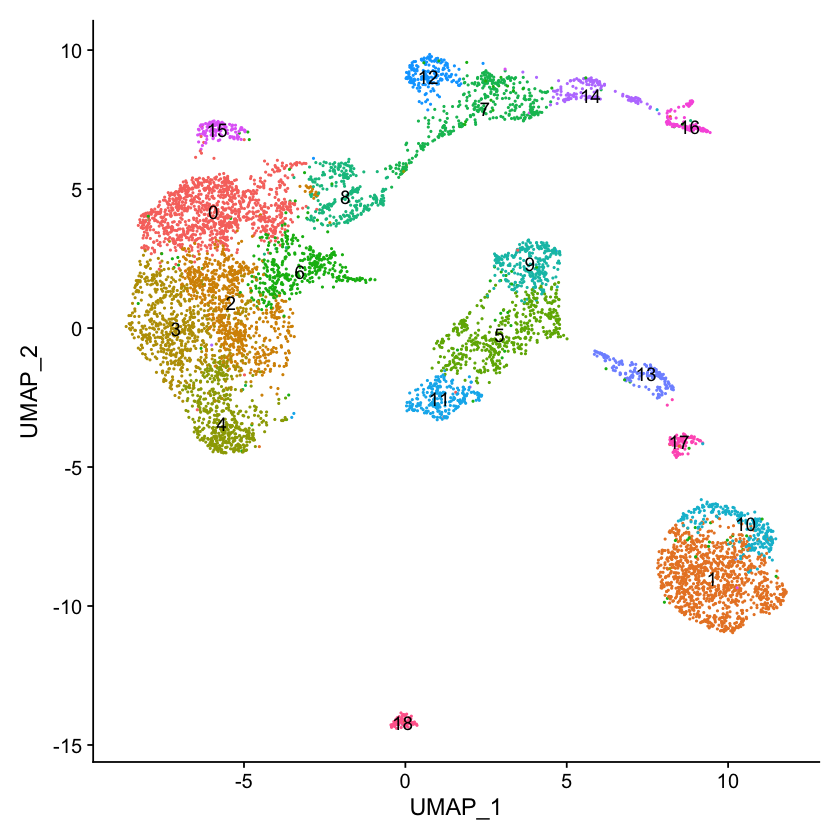

In [4]:
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

## Preprocessing

In [5]:
Idents(seu_HQC) <- "seurat_clusters"

In [6]:
seu_HQC_polecell <- subset(seu_HQC, ident = c("18"))
seu_HQC_polecell

An object of class Seurat 
28830 features across 82 samples within 2 assays 
Active assay: SCT (11326 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [7]:
# Removing pole cell temporarily
seu_HQC_woPC <- subset(seu_HQC, ident = 18, invert = T)
seu_HQC_woPC

An object of class Seurat 
28830 features across 7232 samples within 2 assays 
Active assay: SCT (11326 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

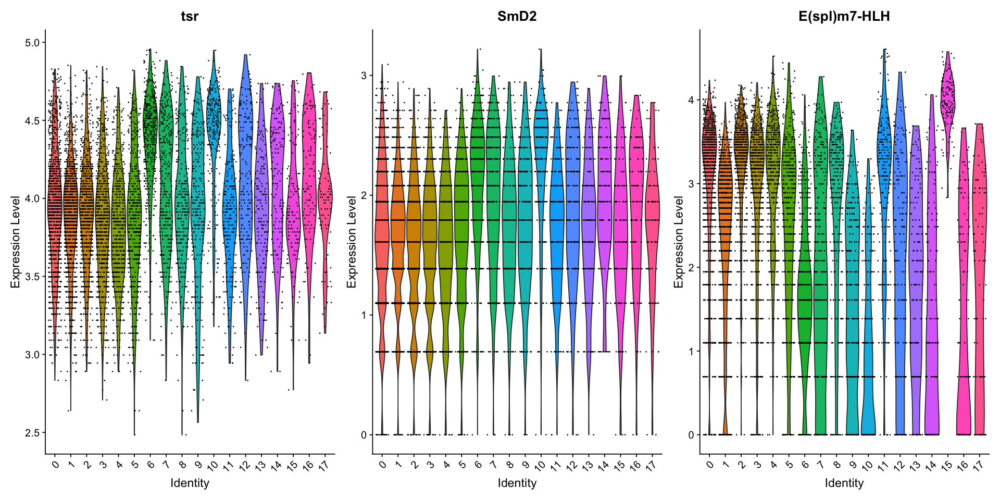

In [8]:
options(repr.plot.width=16, repr.plot.height=8)
VlnPlot(seu_HQC_woPC, c("tsr", "SmD2",  "E(spl)m7-HLH"), pt.size = 0.1)

In [9]:
#re-normalize without pole cells
DefaultAssay(seu_HQC_woPC) <- "RNA"
seu_HQC_woPC <- suppressWarnings(SCTransform(seu_HQC_woPC, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE) )

## Get tsr-correlated genes

In [10]:
HVG2000 <- head(VariableFeatures(seu_HQC_woPC), 2000)
length(HVG2000)
head(HVG2000)

[1] 2000

[1] "sog"   "peb"   "Abd-B" "ImpE2" "bnl"   "salm"

In [11]:
seu_HQC_2000 <- seu_HQC_woPC[HVG2000,]
seu_HQC_2000

An object of class Seurat 
4000 features across 7232 samples within 2 assays 
Active assay: SCT (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [12]:
normcount <- GetAssayData(seu_HQC_2000)
dim(normcount)

[1] 2000 7232

In [13]:
normcount <- as.data.frame(t(normcount))
head(normcount)
dim(normcount)

,sog,peb,Abd-B,ImpE2,bnl,salm,ct,mirr,CG13465,Optix,⋯,Fum2,dyl,NKAIN,tio,htt,cry,asRNA:CR45260,Cht6,lncRNA:CR44111,Balat
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGTGACCTT,0.6931472,0.000000,0.000000,3.73767,0.6931472,1.098612,0,1.098612,0.000000,0,⋯,0,0,0.6931472,0.0000000,0.6931472,0,0,0.0000000,0,0
AAACCCACAAGTGATA,3.9702919,0.000000,1.945910,0.00000,0.0000000,0.000000,0,0.000000,3.258097,0,⋯,0,0,0.6931472,0.0000000,0.6931472,0,0,0.6931472,0,0
AAACCCACACTTGGCG,1.3862944,2.564949,1.386294,0.00000,0.0000000,3.555348,0,0.000000,1.098612,0,⋯,0,0,1.0986123,0.0000000,0.0000000,0,0,1.0986123,0,0
AAACCCATCCGTGTCT,3.4011974,0.000000,0.000000,0.00000,0.0000000,0.000000,0,0.000000,0.000000,0,⋯,0,0,0.0000000,0.6931472,0.0000000,0,0,0.0000000,0,0
AAACGAAAGAATCGTA,0.0000000,3.178054,0.000000,0.00000,0.0000000,0.000000,0,3.465736,1.609438,0,⋯,0,0,0.0000000,0.0000000,0.0000000,0,0,0.0000000,0,0
AAACGAAAGACTTCCA,0.0000000,3.806662,0.000000,0.00000,0.0000000,1.791759,0,3.713572,1.386294,0,⋯,0,0,0.0000000,0.0000000,0.6931472,0,0,0.0000000,0,0


[1] 7232 2000

In [14]:
library(corrr)
corr <- correlate(normcount)


Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




In [15]:
corr_tsr <- focus(corr, "tsr")
corr_tsr <- na.omit(corr_tsr)
corr_tsr[order(-corr_tsr$tsr), ]

term,tsr
<chr>,<dbl>
Fkbp12,0.7908534
His4r,0.7498494
smt3,0.7495464
alphaTub84B,0.7344588
betaTub56D,0.7024658
His3.3B,0.7017468
CG1943,0.6617064
COX5A,0.6199802
CG4440,0.6052230


In [16]:
corr_tsr <- corr_tsr[corr_tsr$tsr >0.55 | corr_tsr$tsr < -0.5, ]
dim(corr_tsr)
head(corr_tsr)

[1] 34  2

term,tsr
<chr>,<dbl>
CG4440,0.6052230
kis,-0.5689527
Df31,0.5995775
mt:srRNA,-0.6407785
betaTub56D,0.7024658
spen,-0.5515417


In [17]:
normcount_tsr_corr <- normcount[, c("tsr", corr_tsr$term) ]
head(normcount_tsr_corr)
dim(normcount_tsr_corr)

,tsr,CG4440,kis,Df31,mt:srRNA,betaTub56D,spen,mt:ND1,ed,mt:ND4,⋯,Fkbp12,CG11137,CG8860,CG1943,roh,CG13551,COX5A,CG7630,ATPsynG,His3.3B
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGTGACCTT,4.189655,5.003946,1.609438,5.176150,2.484907,4.465908,2.564949,1.098612,1.386294,3.258097,⋯,4.369448,1.7917595,2.302585,3.663562,2.197225,2.708050,2.397895,2.833213,2.833213,3.806662
AAACCCACAAGTGATA,3.526361,4.317488,3.401197,4.912655,2.484907,4.330733,3.332205,2.944439,2.708050,3.713572,⋯,3.610918,1.9459101,1.791759,3.295837,2.708050,1.945910,2.302585,2.197225,2.772589,3.332205
AAACCCACACTTGGCG,3.433987,3.951244,3.401197,4.663439,3.610918,4.369448,3.401197,2.564949,2.639057,3.688879,⋯,3.178054,0.6931472,1.791759,3.258097,1.945910,2.079442,1.609438,1.098612,2.708050,3.135494
AAACCCATCCGTGTCT,3.433987,3.970292,2.564949,4.382027,3.091042,3.737670,3.091042,2.708050,2.708050,3.555348,⋯,3.555348,1.0986123,1.386294,2.484907,1.945910,1.098612,1.386294,1.791759,2.708050,3.044522
AAACGAAAGAATCGTA,3.688879,4.787492,2.772589,4.875197,2.079442,4.905275,2.833213,2.995732,2.302585,3.258097,⋯,3.555348,1.7917595,1.945910,3.433987,2.564949,1.945910,2.772589,2.564949,2.484907,3.784190
AAACGAAAGACTTCCA,4.007333,5.099866,3.688879,5.111988,1.098612,4.330733,3.295837,2.397895,2.639057,2.397895,⋯,4.110874,0.6931472,2.079442,3.465736,2.079442,2.484907,2.397895,2.639057,3.135494,3.218876


[1] 7232   35

In [18]:
pca<-prcomp(normcount_tsr_corr)
dim(pca$x)

[1] 7232   35

In [19]:
pca <- as.data.frame(pca$x)

In [20]:
head(pca)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCAAGTGACCTT,-1.5316640,-0.3163114,-0.72300418,0.2618518,-0.25125520,-0.7601461,0.37021947,0.11439924,0.80105017,-0.50606703,⋯,0.26929907,-0.27813648,0.27142591,0.12948202,-0.12761001,-0.12788899,-0.16133816,0.21684025,-0.006556837,-0.423785236
AAACCCACAAGTGATA,1.6351030,0.5646456,0.23477885,0.4472208,0.41704906,-0.3596028,-0.04315424,0.00427096,0.13337165,0.22886201,⋯,-0.08795139,-0.16202087,-0.06642088,-0.19532844,0.14029545,0.10750787,0.10450245,0.13525257,0.166223427,-0.024432667
AAACCCACACTTGGCG,2.3542385,0.1851932,0.61269969,-0.3638376,-0.43081448,0.5814123,-0.59623118,0.38832109,-0.08968298,-0.37365675,⋯,-0.22518916,-0.19867225,-0.02062395,-0.26546783,0.05847525,0.31483987,0.30450458,-0.12331021,0.120214886,0.328673889
AAACCCATCCGTGTCT,2.5862556,-0.5885604,-0.09239642,-0.1600629,0.03798666,0.2284703,0.33732711,-0.05623820,-0.48756875,0.00872514,⋯,-0.07598206,0.43530980,0.22904413,-0.03226932,-0.26582538,-0.02320782,-0.00652772,0.11148254,-0.376072563,-0.181699735
AAACGAAAGAATCGTA,0.1329092,-0.1760520,-0.69792374,0.1601455,0.67560138,-0.3319155,-0.31351276,0.33286875,1.04651754,-0.07685309,⋯,-0.24063377,0.06492993,-0.23008157,-0.55419576,0.16285713,0.43584383,-0.20525416,0.06425328,-0.001291545,-0.068334716
AAACGAAAGACTTCCA,-0.1961841,1.9869079,-1.65171461,-0.6872971,-0.32546082,-0.1190040,-0.19599863,-0.03938205,-0.30342390,-0.09821297,⋯,0.29926169,-0.13780342,-0.27433027,-0.05407591,-0.08686990,-0.15688025,-0.04082310,0.18397531,-0.084149382,-0.001971327


In [21]:
pca30 <- pca[, 1:30]
pca10 <- pca[, 1:10]

## Clustering using tsr-correlating genes

In [22]:
set.seed(256) 

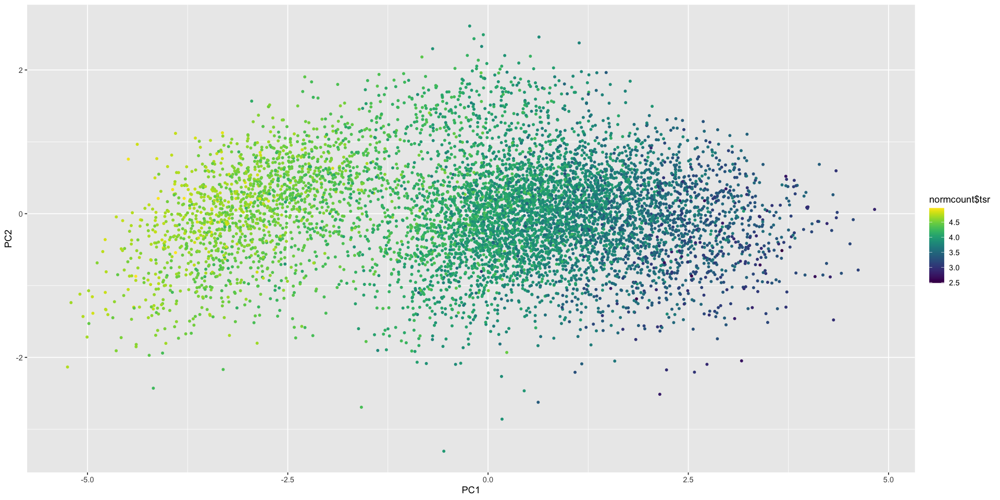

In [23]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC2 ,col = normcount$tsr))+ geom_point(size = 1)    + scale_color_viridis(option = "D")

In [24]:
mc <- Mclust(pca30,G=2,modelNames="VVV")

In [25]:
mc_result <- mc$classification 
mc_result <- as.data.frame(mc_result)
colnames(mc_result) <- c("stressed_ID_mc")
head(mc_result)

,stressed_ID_mc
,<dbl>
AAACCCAAGTGACCTT,1
AAACCCACAAGTGATA,2
AAACCCACACTTGGCG,2
AAACCCATCCGTGTCT,2
AAACGAAAGAATCGTA,2
AAACGAAAGACTTCCA,2


In [26]:

length(mc_result[mc_result$stressed_ID_mc==1, ])
length(mc_result[mc_result$stressed_ID_mc==2, ])

[1] 2230

[1] 5002

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,stressed_ID_mc
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACCCAAGTGACCTT,-1.5316640,-0.3163114,-0.72300418,0.2618518,-0.25125520,-0.7601461,0.37021947,0.11439924,0.80105017,-0.50606703,⋯,-0.27813648,0.27142591,0.12948202,-0.12761001,-0.12788899,-0.16133816,0.21684025,-0.006556837,-0.423785236,1
AAACCCACAAGTGATA,1.6351030,0.5646456,0.23477885,0.4472208,0.41704906,-0.3596028,-0.04315424,0.00427096,0.13337165,0.22886201,⋯,-0.16202087,-0.06642088,-0.19532844,0.14029545,0.10750787,0.10450245,0.13525257,0.166223427,-0.024432667,2
AAACCCACACTTGGCG,2.3542385,0.1851932,0.61269969,-0.3638376,-0.43081448,0.5814123,-0.59623118,0.38832109,-0.08968298,-0.37365675,⋯,-0.19867225,-0.02062395,-0.26546783,0.05847525,0.31483987,0.30450458,-0.12331021,0.120214886,0.328673889,2
AAACCCATCCGTGTCT,2.5862556,-0.5885604,-0.09239642,-0.1600629,0.03798666,0.2284703,0.33732711,-0.05623820,-0.48756875,0.00872514,⋯,0.43530980,0.22904413,-0.03226932,-0.26582538,-0.02320782,-0.00652772,0.11148254,-0.376072563,-0.181699735,2
AAACGAAAGAATCGTA,0.1329092,-0.1760520,-0.69792374,0.1601455,0.67560138,-0.3319155,-0.31351276,0.33286875,1.04651754,-0.07685309,⋯,0.06492993,-0.23008157,-0.55419576,0.16285713,0.43584383,-0.20525416,0.06425328,-0.001291545,-0.068334716,2
AAACGAAAGACTTCCA,-0.1961841,1.9869079,-1.65171461,-0.6872971,-0.32546082,-0.1190040,-0.19599863,-0.03938205,-0.30342390,-0.09821297,⋯,-0.13780342,-0.27433027,-0.05407591,-0.08686990,-0.15688025,-0.04082310,0.18397531,-0.084149382,-0.001971327,2


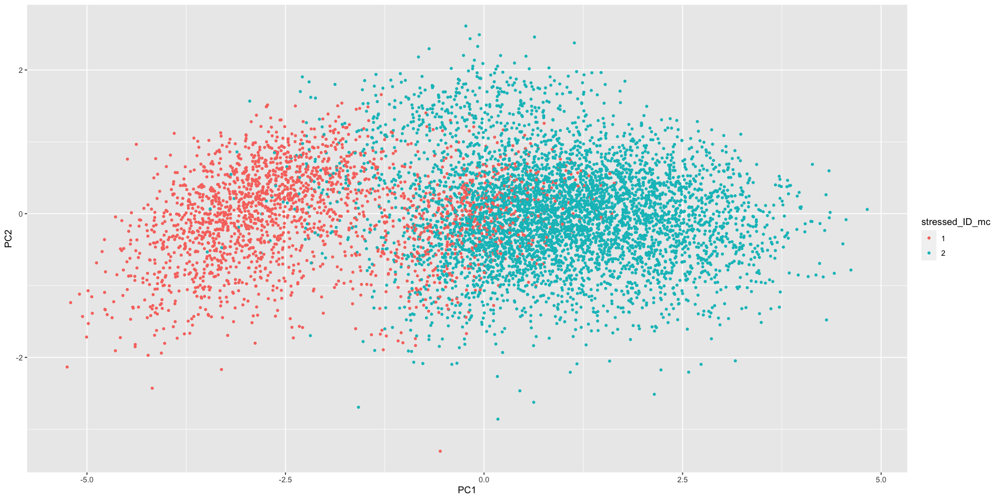

In [27]:
pca$stressed_ID_mc <- as.factor(mc_result$stressed_ID_mc)
head(pca)

options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC2 ,col = stressed_ID_mc))+ geom_point(size =1) 

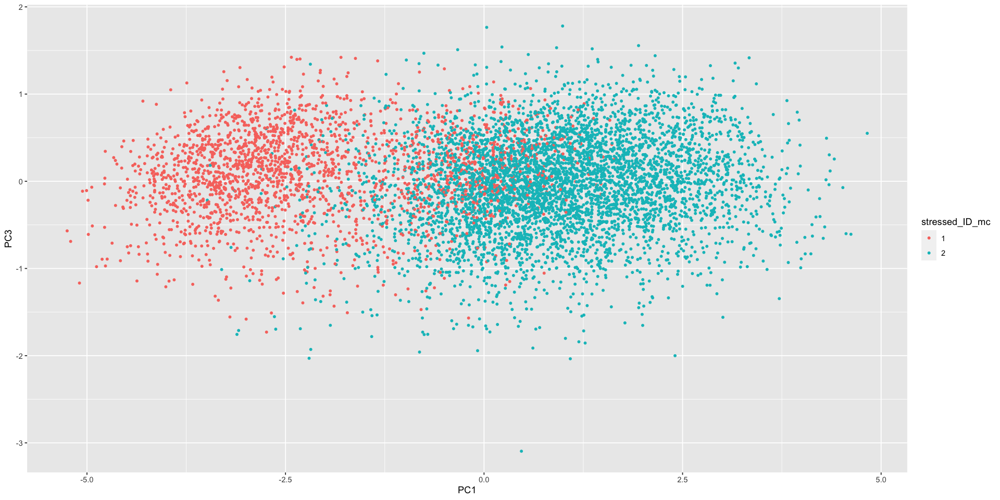

In [28]:
options(repr.plot.width=16, repr.plot.height=8)
ggplot(pca,　aes(x=PC1,y=PC3 ,col = stressed_ID_mc))+ geom_point(size =1) 

In [29]:
seu_HQC_woPC$stressed_ID <- mc_result
seu_HQC_woPC

Idents(seu_HQC_woPC) <- "stressed_ID"

An object of class Seurat 
28792 features across 7232 samples within 2 assays 
Active assay: SCT (11288 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

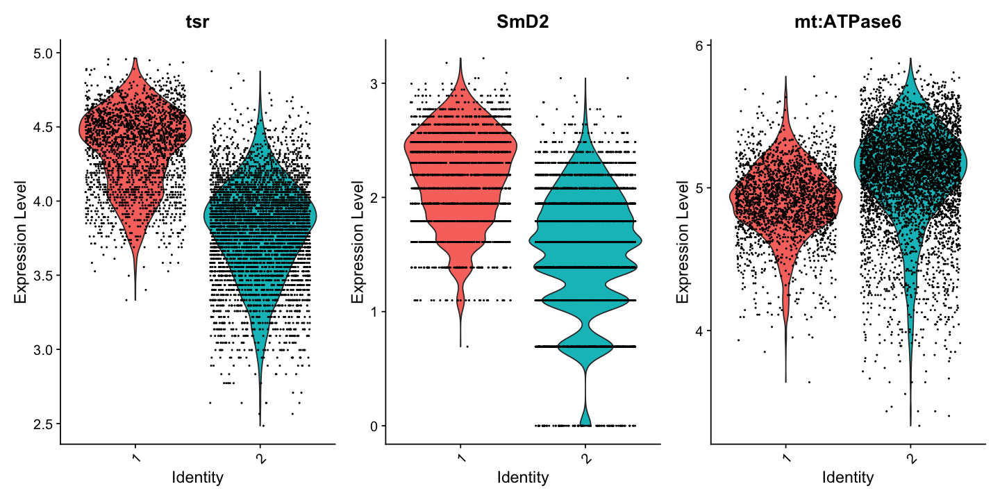

In [30]:
options(repr.plot.width=12, repr.plot.height=6)
VlnPlot(seu_HQC_woPC, features = c("tsr", "SmD2",  "mt:ATPase6"), pt.size = 0.2)

In [31]:
stress.markers <- FindAllMarkers(object = seu_HQC_woPC, only.pos = TRUE)
stress.markers.top20 <- stress.markers %>% group_by(cluster) %>% top_n(-20, wt = p_val_adj)
nrow(stress.markers.top20)

Calculating cluster 1

Calculating cluster 2



[1] 76

Warning message in DoHeatmap(seu_HQC_woPC, features = c(stress.markers.top20$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: pAbp, His2Av, 14-3-3epsilon, B52, Nlp, COX4, Hel25E, ATPsynE, Su(var)205, COX6B, Ref1, ATPsynCF6, CG18081, SkpA, Bin1”


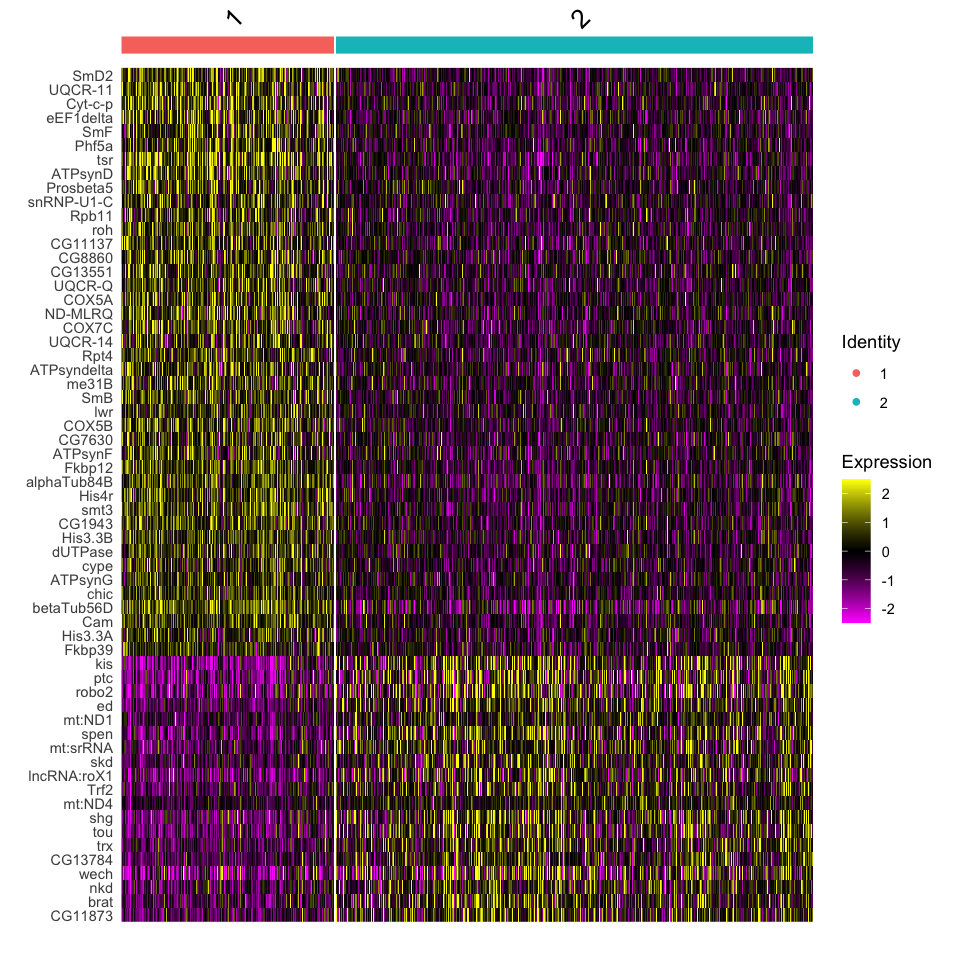

In [32]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu_HQC_woPC, features = c(stress.markers.top20$gene))

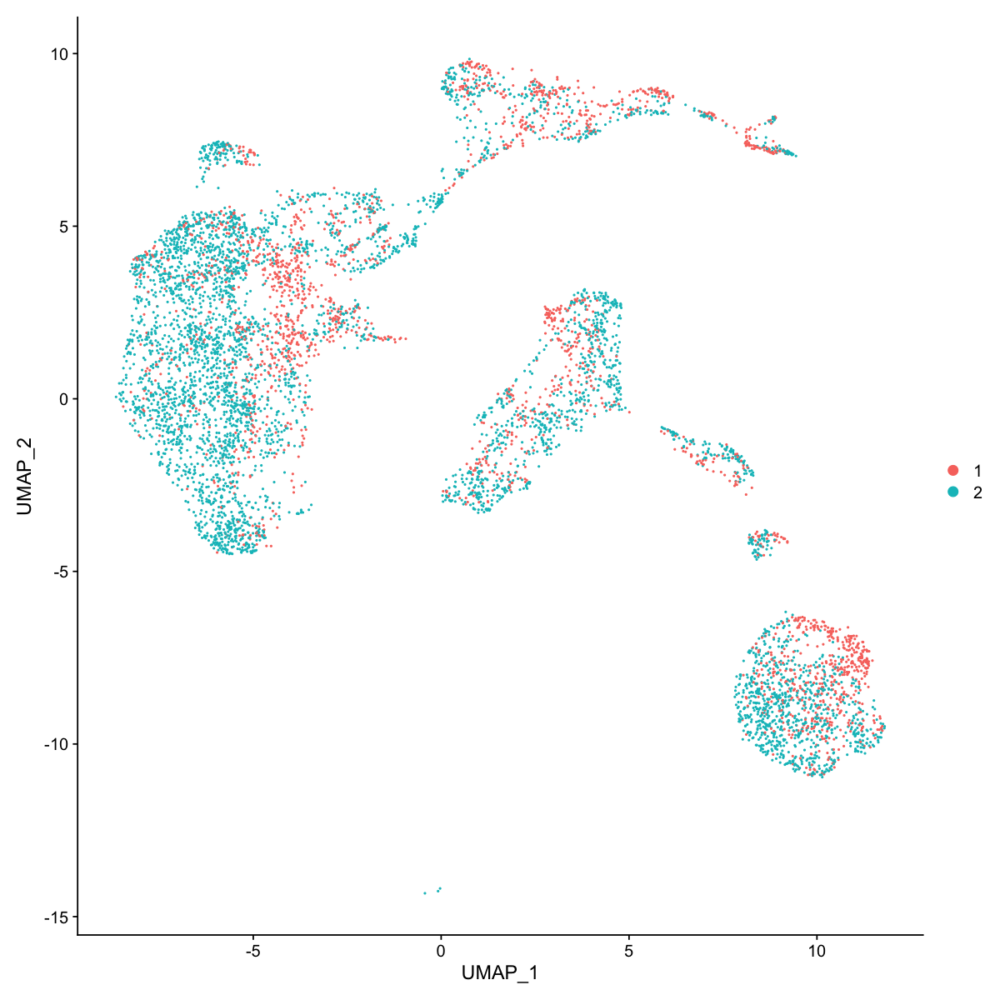

In [33]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seu_HQC_woPC, reduction =  "umap", label = F) 

In [34]:
head(mc_result)

,stressed_ID_mc
,<dbl>
AAACCCAAGTGACCTT,1
AAACCCACAAGTGATA,2
AAACCCACACTTGGCG,2
AAACCCATCCGTGTCT,2
AAACGAAAGAATCGTA,2
AAACGAAAGACTTCCA,2


In [35]:
nonstressed_list <- rownames(filter(mc_result, stressed_ID_mc==2))

In [36]:
length(nonstressed_list)

[1] 5002

In [37]:
polecell_list <- colnames(seu_HQC_polecell)
length(polecell_list)
head(polecell_list)

[1] 82

[1] "AAAGTCCAGAGTCACG" "AAGCGTTTCAAACCTG" "AAGTACCAGAGAGCCT" "AATGAAGGTAGCACGA"
[5] "ACAGCCGCACGCGTGT" "ACATTTCGTGTTCGTA"

In [38]:
keep_list <- c(nonstressed_list, polecell_list)
length(keep_list)

[1] 5084

In [39]:
seu_HQC2 <- seu_HQC
seu_HQC2

An object of class Seurat 
28830 features across 7314 samples within 2 assays 
Active assay: SCT (11326 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [40]:
seu_HQC2 <- seu_HQC2[, keep_list]

In [41]:
seu_HQC2

An object of class Seurat 
28830 features across 5084 samples within 2 assays 
Active assay: SCT (11326 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

## Clustering without stressed cells

In [42]:
DefaultAssay(seu_HQC_woPC) <- "RNA"
seu_HQC2 <- suppressWarnings(SCTransform(seu_HQC2, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

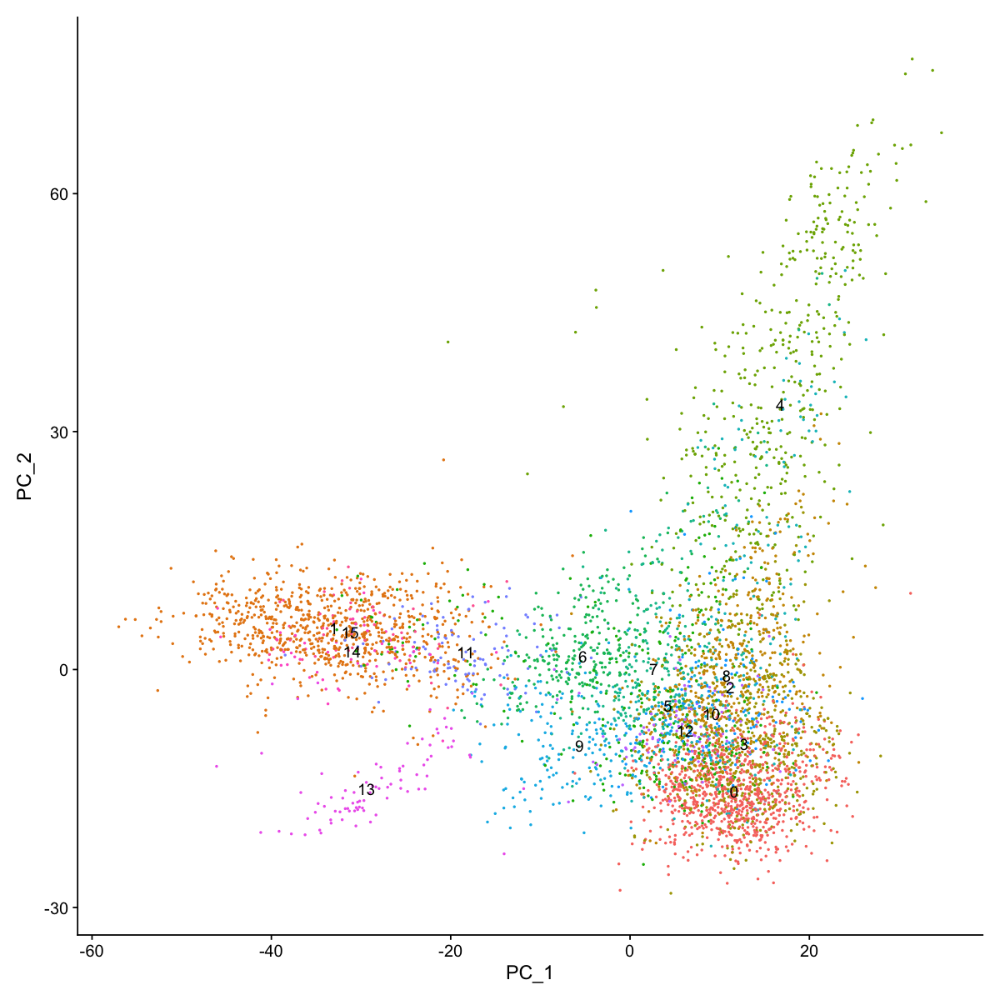

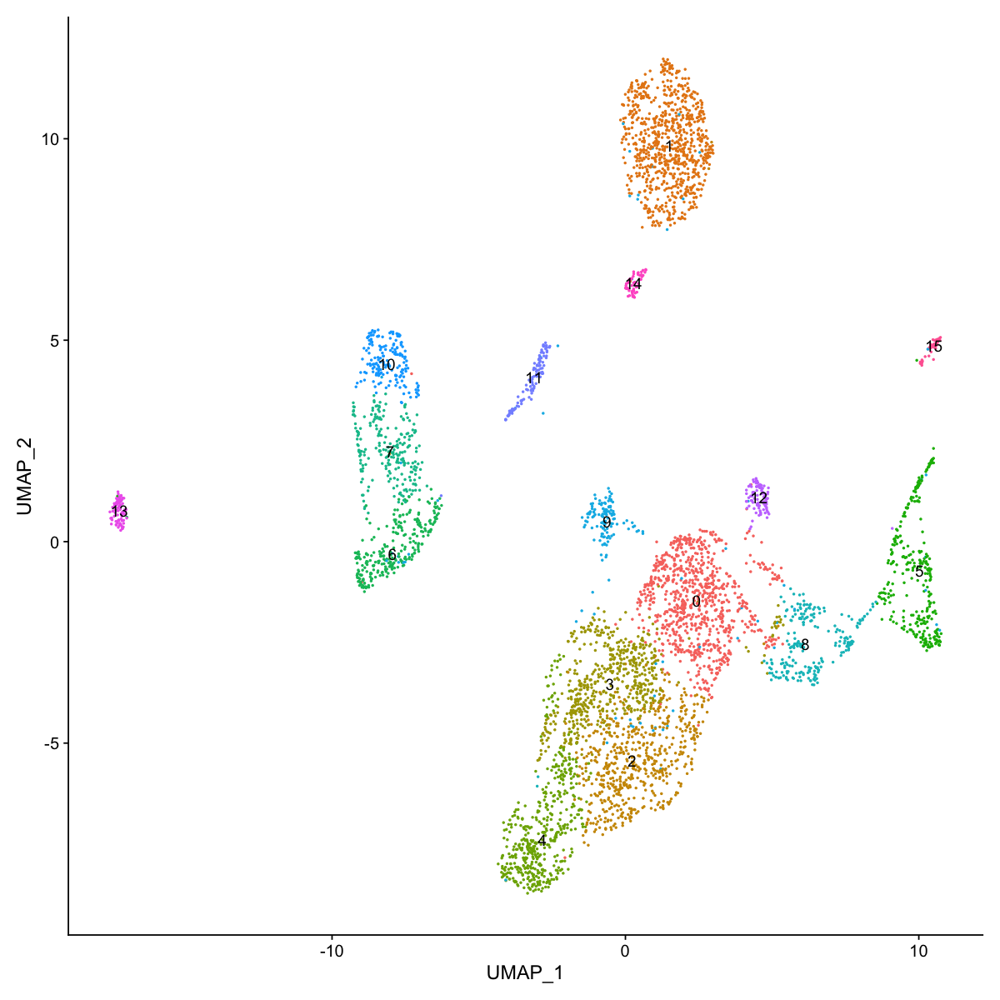

In [43]:
seu_HQC2 <- RunPCA(seu_HQC2, verbose = FALSE)
seu_HQC2 <- RunUMAP(seu_HQC2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC2 <- FindNeighbors(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE)
DimPlot(seu_HQC2, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

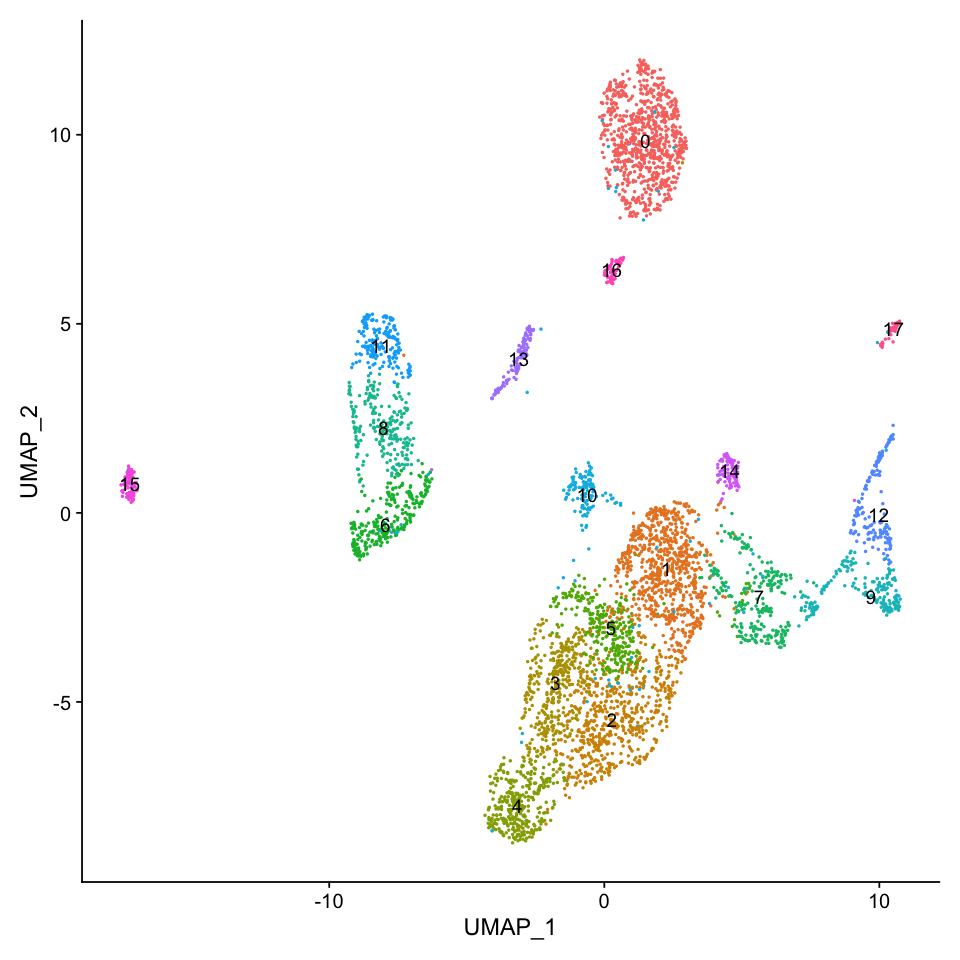

In [44]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE, resolution=1)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

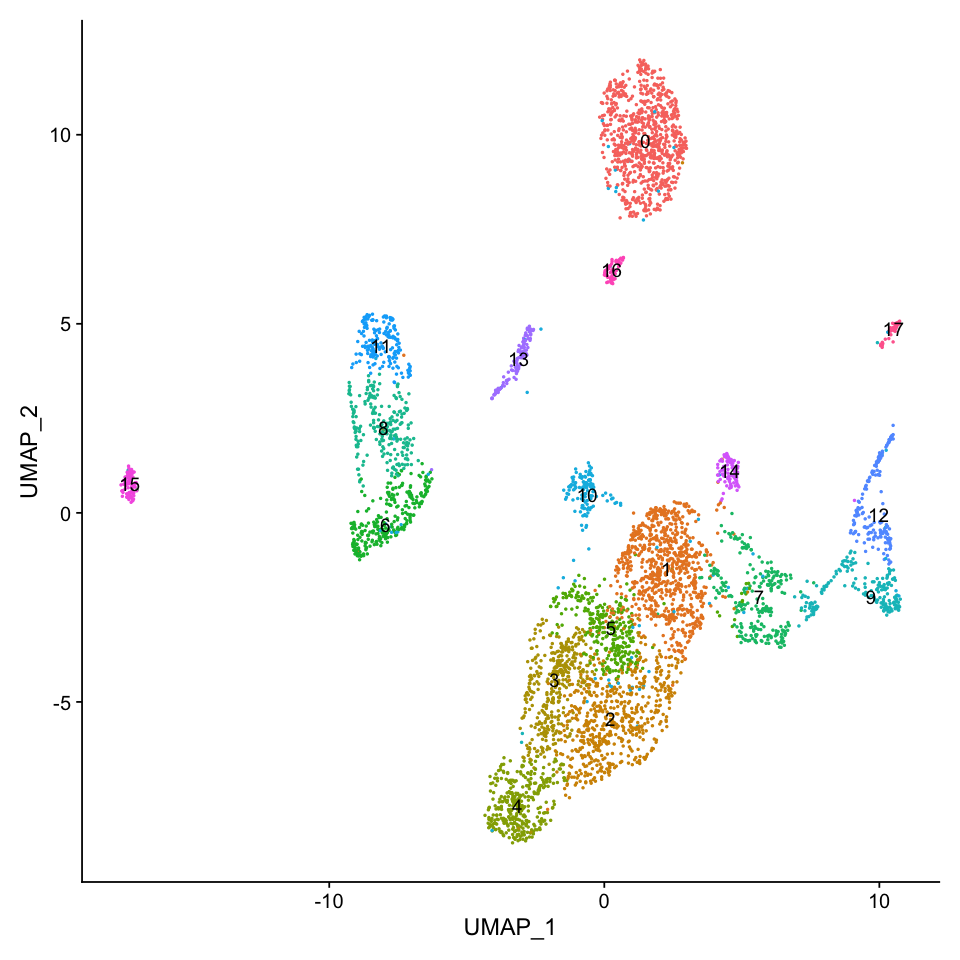

In [45]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE, resolution=1.1)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

In [46]:
all.markers2 <- FindAllMarkers(object = seu_HQC2, only.pos = TRUE)
all.markers2.top10 <- all.markers2 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



Warning message in DoHeatmap(seu_HQC2, features = all.markers2.top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: COX8”


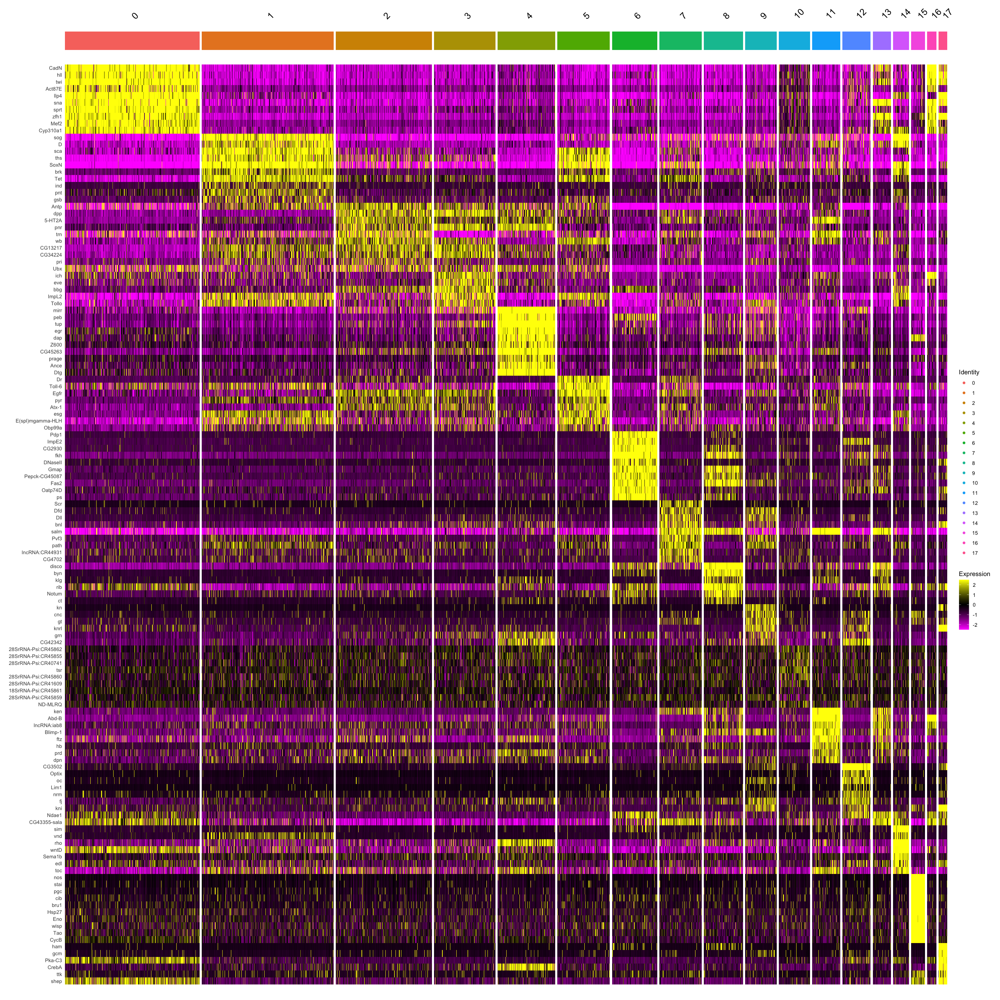

In [47]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC2, features = all.markers2.top10$gene)

In [48]:
# removing clust10 (remaining tsr+ cells)
seu_HQC2 <- subset(seu_HQC2, ident = c(10), invert = T)
seu_HQC2

An object of class Seurat 
28376 features across 4897 samples within 2 assays 
Active assay: SCT (10872 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering again

In [49]:
DefaultAssay(seu_HQC2) <- "RNA"
seu_HQC2 <- SCTransform(seu_HQC2, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE) 

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

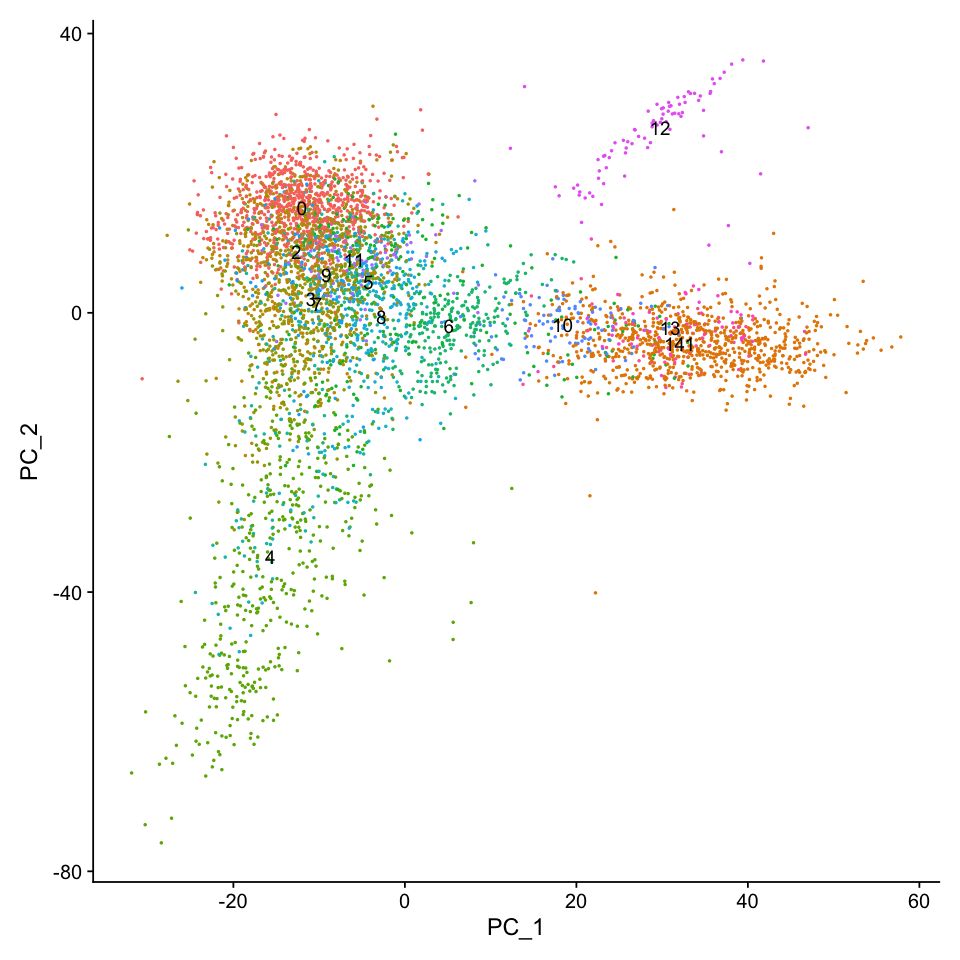

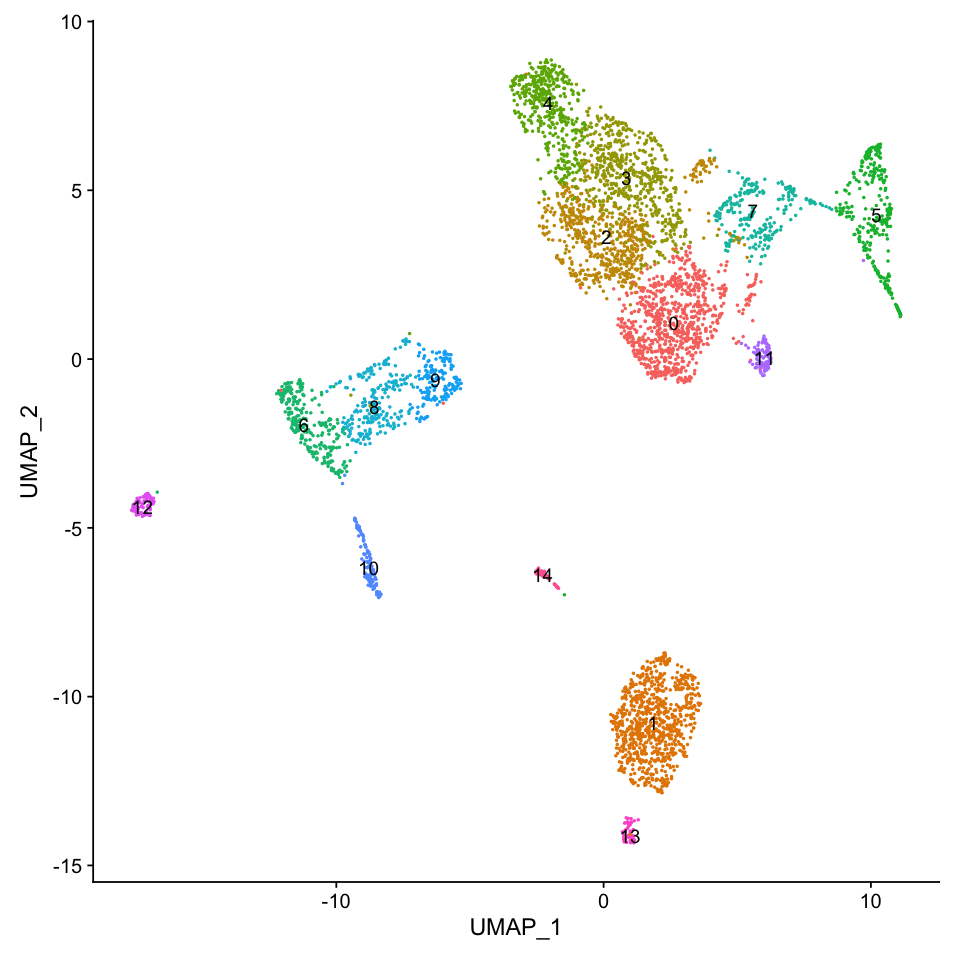

In [50]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- RunPCA(seu_HQC2, verbose = FALSE)
seu_HQC2 <- RunUMAP(seu_HQC2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC2 <- FindNeighbors(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE)
DimPlot(seu_HQC2, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

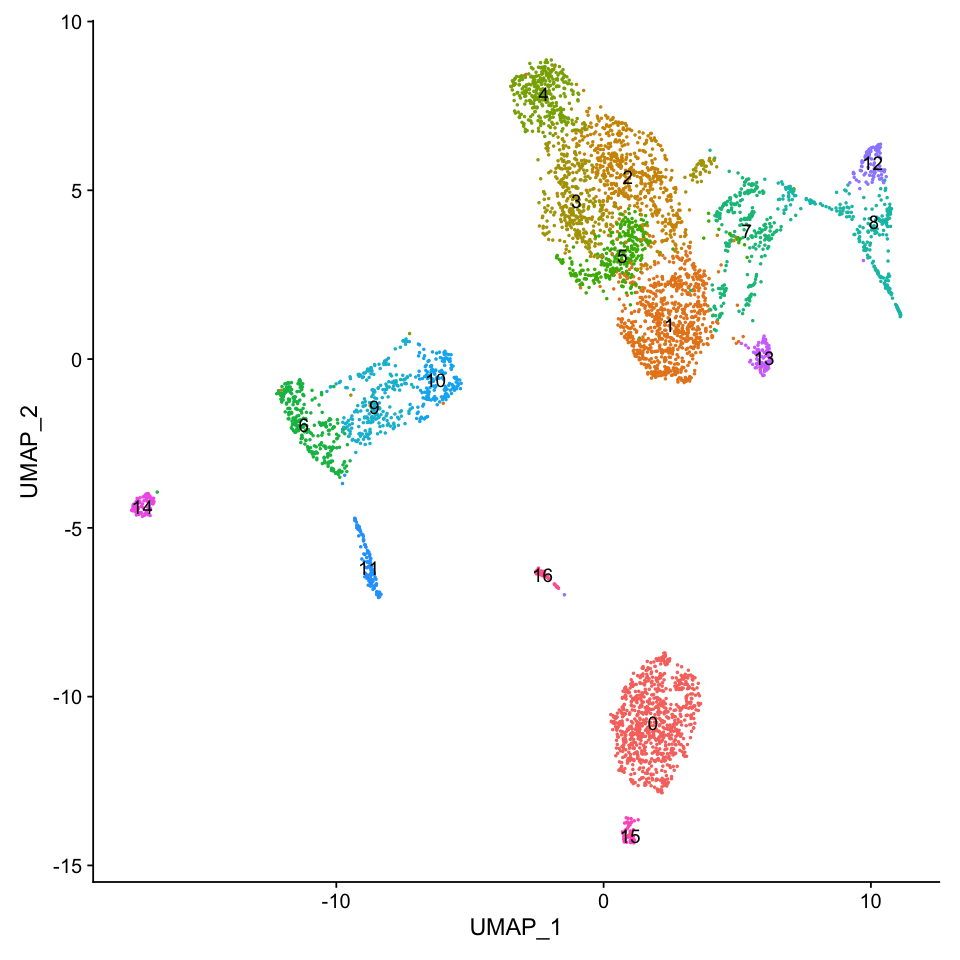

In [51]:
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE, resolution=1)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

In [52]:
all.markers2 <- FindAllMarkers(object = seu_HQC2, only.pos = TRUE)
all.markers2.top10 <- all.markers2 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16



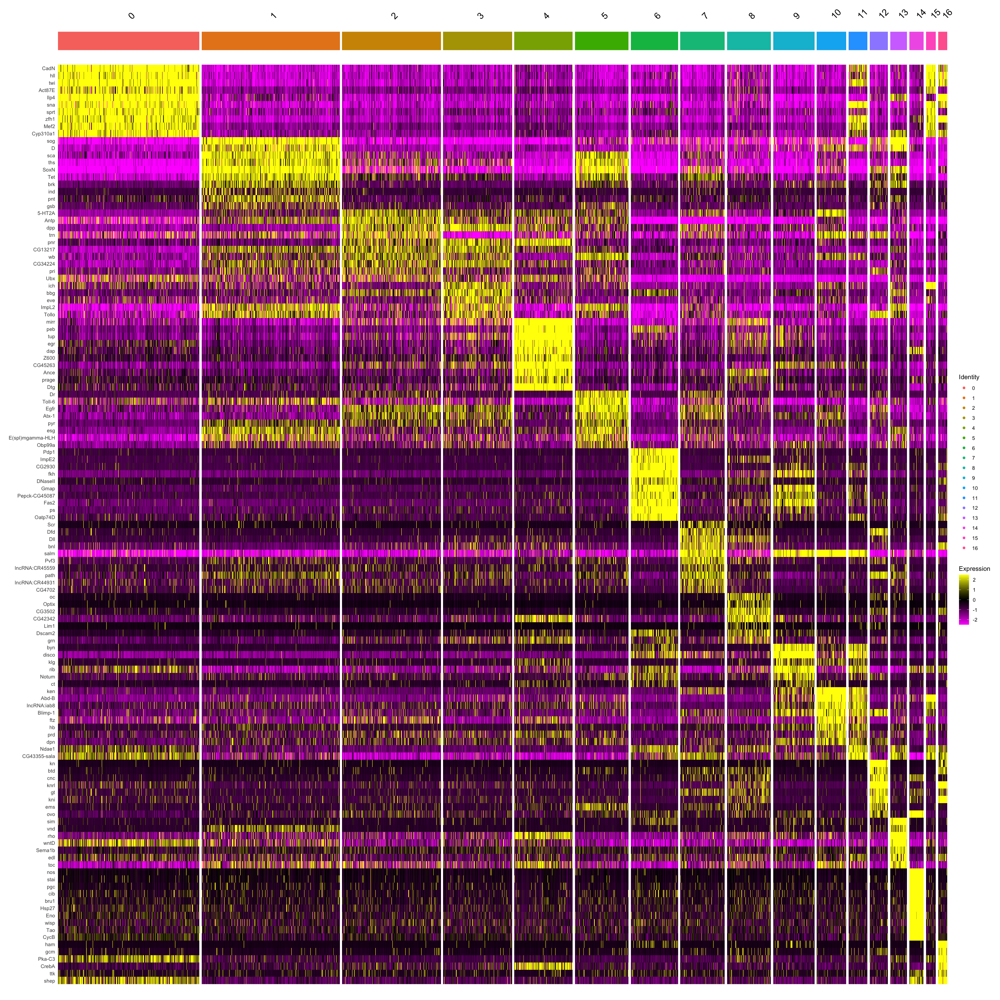

In [53]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC2, features = all.markers2.top10$gene)

In [54]:
manual_ID <- as.data.frame(seu_HQC2$seurat_clusters)
colnames(manual_ID) <- c('manual_ID')
head(manual_ID)

manual_ID$manual_ID <- dplyr::recode(manual_ID$manual_ID, 
                                        "0" = "Trunk_mesoderm", #sna+, twi+, Antp+, Ubx+
                                        "1" = "Medial_neuroectoderm", #sog+, SoxN+
                                        "2" = "Dorsal_ectoderm_even", #dpp+, trn+
                                        "3" = "Dorsal_ectoderm_odd", #dpp+, trn-
                                        "4" = "Amnioserosa", #dap+
                                        "5" = "Lateral_neuroectoderm", #SoxN+, sog-
                                        "6" = "Posterior_midgut", #fkh+, hkb+
                                        "7" = "Ectoderm_PS1-2", #Dfd+, Scr+
                                        "8" = "Head_ectoderm", #oc+
                                        "9" = "Hindgut", #fkh+, byn+
                                        "10" = "Ectoderm_PS14", #Abd-B+, trn+
                                        "11" = "Posterior_mesoderm", #sna+, twi+, Abd-B+, trn+
                                        "12" = "Ectoderm_kn", #kn+
                                        "13" = "Midline_cells", #sim+
                                        "14" = "Pole_cells", #pgc+
                                        "15" = "Mesoderm_PS13", #sna+, twi+, Abd-B+, trn-
                                        "16" = "Anterior_mesoderm" #sna+, twi+, gcm+
                                     )
head(manual_ID)

,manual_ID
,<fct>
AAACCCACAAGTGATA,8
AAACCCACACTTGGCG,9
AAACCCATCCGTGTCT,1
AAACGAAAGAATCGTA,4
AAACGAAAGACTTCCA,4
AAACGAATCAAGCCTA,3


,manual_ID
,<fct>
AAACCCACAAGTGATA,Head_ectoderm
AAACCCACACTTGGCG,Hindgut
AAACCCATCCGTGTCT,Medial_neuroectoderm
AAACGAAAGAATCGTA,Amnioserosa
AAACGAAAGACTTCCA,Amnioserosa
AAACGAATCAAGCCTA,Dorsal_ectoderm_odd


In [55]:
seu_HQC2$annotated_seurat_clusters <- manual_ID

In [56]:
write.table(manual_ID, 
            file="./seurat_clusters.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [57]:
# write.table(levels(seu_HQC2) , 
#             file="./210527_seurat_objects/seu_HQC2_manual_ID_list_210527.txt",sep="\t",col.names=T,row.names=T,quote=F)
# #エクセルで修正 してカラーコードを追加、seu_HQC2_manual_ID_levels_color_210527.txtとして保存

In [58]:
saveRDS(seu_HQC2, file = "../../data/seurat_object/Set2/seu_HQC2_Set2.obj")
write.table(all.markers2, file="./seu_HQC2_all.markers.txt",sep="\t",col.names=T,row.names=T,quote=F)

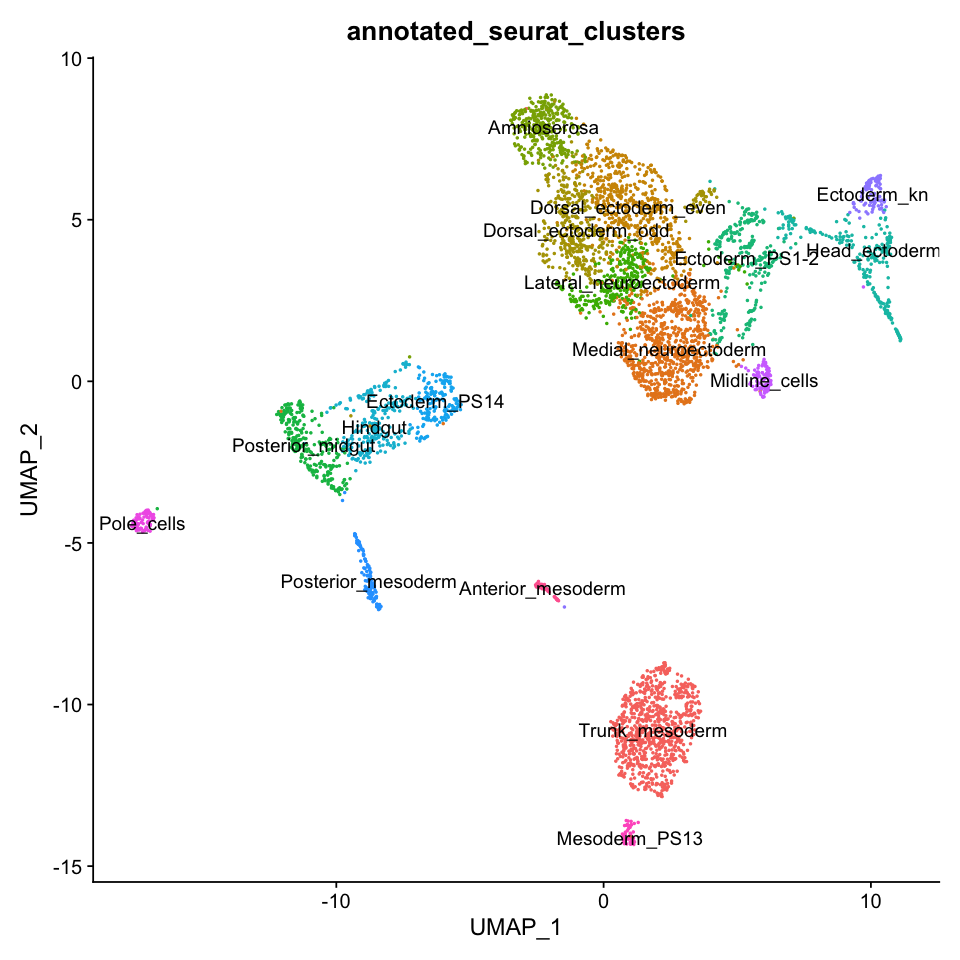

In [59]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE, group.by = 'annotated_seurat_clusters') + NoLegend()

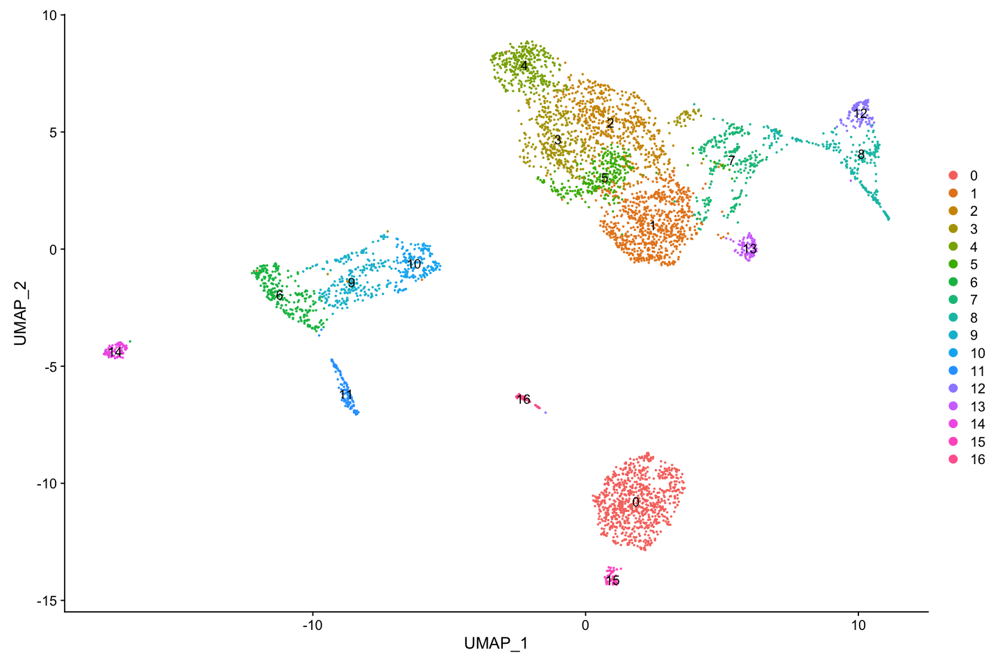

In [60]:
options(repr.plot.width=12, repr.plot.height=8)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) 

[1] "Head_ectoderm"         "Ectoderm_kn"           "Ectoderm_PS1-2"       
[4] "Dorsal_ectoderm_odd"   "Dorsal_ectoderm_even"  "Lateral_neuroectoderm"

[1] 17

[1] "lightskyblue1" "skyblue2"      "blue3"         "olivedrab1"   
[5] "olivedrab2"    "olivedrab3"

character(0)

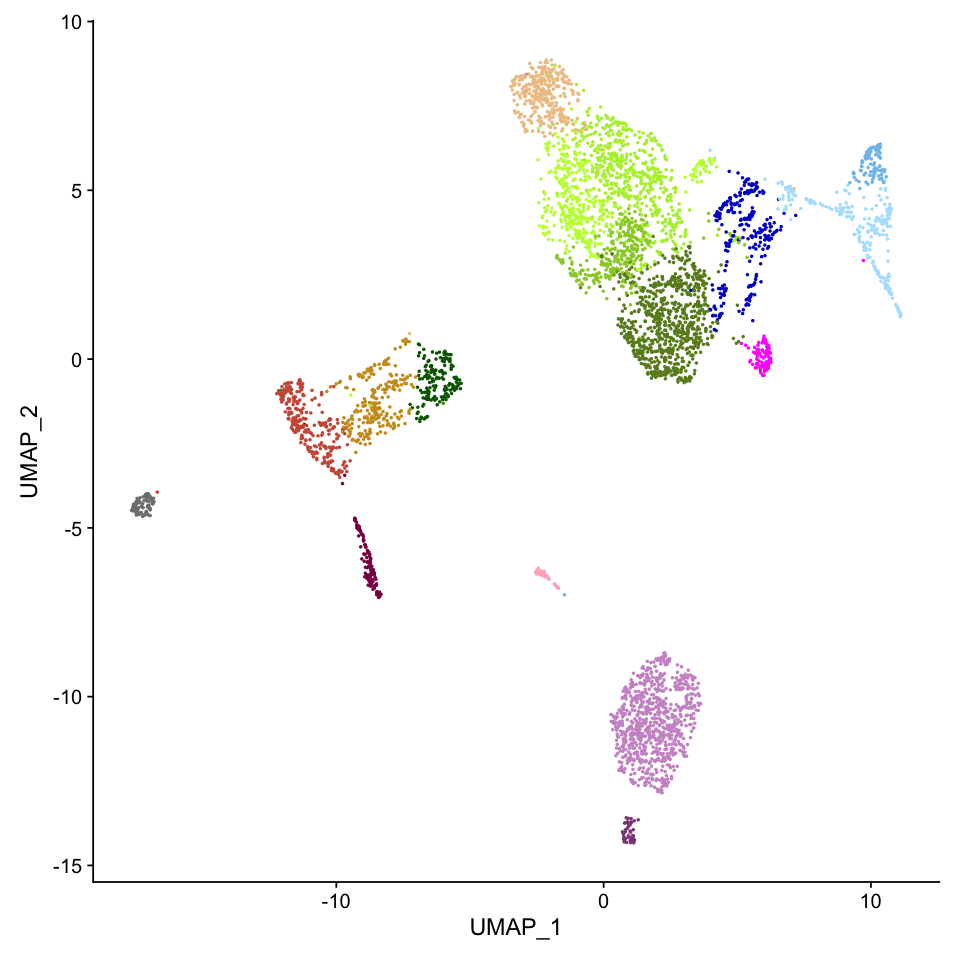

In [61]:
levels <- read.table(file="./seurat_clusters_levels_color_without_tsr_high.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)
setdiff(seu_HQC2$annotated_seurat_clusters,levels)

Idents(seu_HQC2) <- 'annotated_seurat_clusters'
levels(seu_HQC2) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/02_seurat_filter_stressed_cell_Set2/Without_tsr_high_seurat_cluster_umap_Set2.eps", dpi = 300, width =8, height = 8)

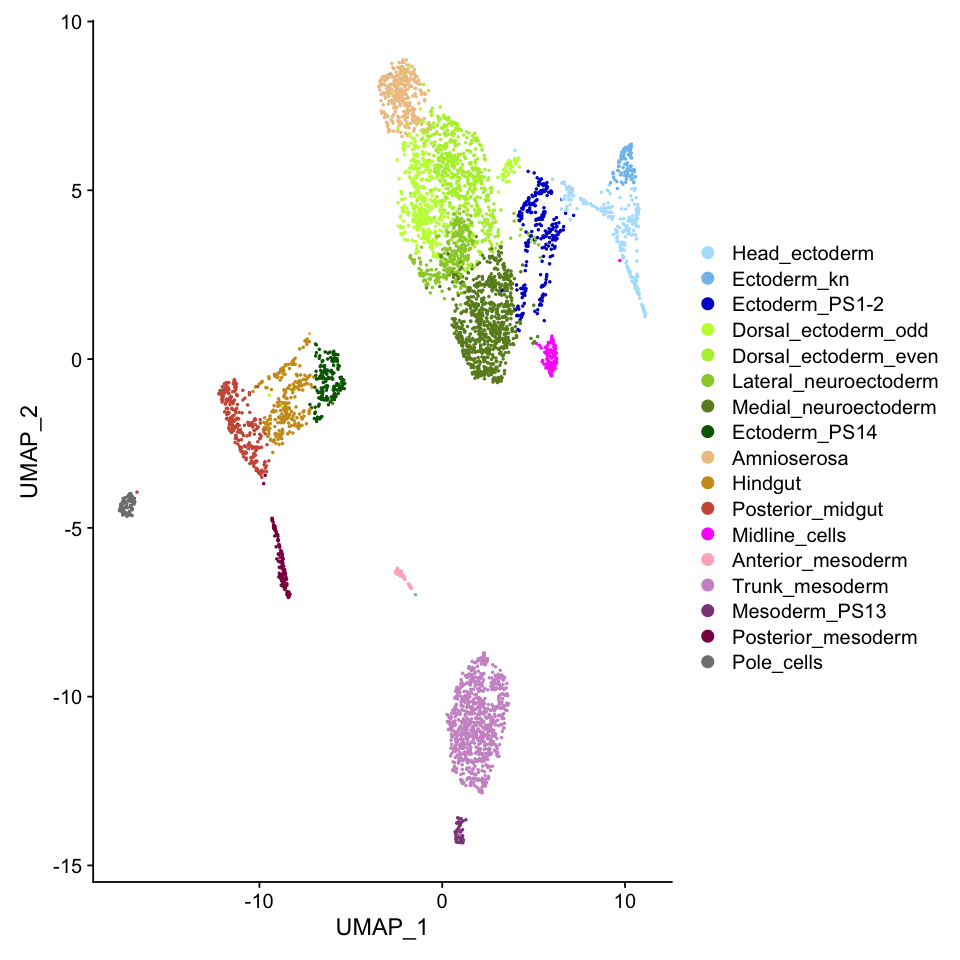

In [62]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/02_seurat_filter_stressed_cell_Set2/Without_tsr_high_seurat_cluster_umap2_Set2.eps", dpi = 300, width =15, height = 8)

In [63]:
path = './figures/gene_expressions_on_UMAP_without_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'Set2_all_cells_without_tsr_high.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [64]:
path = './figures/gene_expressions_on_UMAP_without_tsr_high'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'Set2_all_cells_without_tsr_high_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [65]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] corrr_0.4.3                 mclust_5.4.7               
 [3] viridis_0.5.1               viridisLite_0.3.0          
 [5] MAST_1.16.0                 RColorBrewer_1.1-2         
 [7] dplyr_1.0.3                 Matrix_1.3-2               
 [9] DropletUtils_1.10.2         SingleCellExperiment_1.12.0
[11] SummarizedExperiment_1.20.0 Biobase_2.50.0             
[13] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
[15] IRanges_2.24.1              S4Vectors_0.28